In [1]:
import pandas as pd
import numpy as np
import matplotlib as plt
import seaborn as sns
import math
from bs4 import BeautifulSoup
import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
import re

%matplotlib inline

In [2]:
data = pd.read_csv('NewsArticles.csv')

In [3]:
# The data parsed in with extra blank columns due to encoding formatting.
data.head(10)

,article_id,publish_date,article_source_link,title,subtitle,text,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 134,Unnamed: 135,Unnamed: 136,Unnamed: 137,Unnamed: 138,Unnamed: 139,Unnamed: 140,Unnamed: 141,Unnamed: 142,Unnamed: 143
0,1,2/7/17,http://abcnews.go.com/Politics/pence-break-tie...,"Betsy DeVos Confirmed as Education Secretary, ...",NaN,Michigan billionaire education activist Betsy ...,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2/7/17,http://abcnews.go.com/Politics/wireStory/melan...,Melania Trump Says White House Could Mean Mill...,NaN,First lady Melania Trump has said little about...,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2/7/17,http://abcnews.go.com/Politics/wireStory/trump...,"As Trump Fears Fraud, GOP Eliminates Election ...",NaN,A House committee voted on Tuesday to eliminat...,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2/7/17,http://abcnews.go.com/Politics/appeals-court-d...,Appeals Court to Decide on Challenge to Trump'...,NaN,"This afternoon, three federal judges from the ...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2/7/17,http://abcnews.go.com/US/23-states-winter-weat...,At Least 4 Tornadoes Reported in Southeast Lou...,NaN,At least four tornadoes touched down in Louisi...,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,2/7/17,http://abcnews.go.com/International/wireStory/...,Mother of Backpacker Slain in Australia Critic...,NaN,The mother of a backpacker slain in an Austral...,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,2/7/17,http://abcnews.go.com/Politics/trumps-labor-se...,Trump's Labor Secretary Pick Andrew Puzder Adm...,NaN,"Donald Trump's pick for labor secretary, Andre...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,2/7/17,http://abcnews.go.com/International/wireStory/...,Iran's Top Leader Mocks 'Newcomer' Trump,NaN,"Iran's supreme leader said Tuesday that ""newco...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,2/7/17,http://abcnews.go.com/International/wireStory/...,EU to Britain: Pay Up for What You Ordered Bef...,NaN,The European Union is warning Britain that any...,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,2/7/17,http://abcnews.go.com/US/multi-state-manhunt-s...,Multi-State Manhunt in Southeast Intensifies f...,NaN,A manhunt is intensifying in the Southeast for...,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# All 'Unnamed' columns can be dropped.
data.columns

Index(['article_id', 'publish_date', 'article_source_link', 'title',
       'subtitle', 'text', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8',
       'Unnamed: 9',
       ...
       'Unnamed: 134', 'Unnamed: 135', 'Unnamed: 136', 'Unnamed: 137',
       'Unnamed: 138', 'Unnamed: 139', 'Unnamed: 140', 'Unnamed: 141',
       'Unnamed: 142', 'Unnamed: 143'],
      dtype='object', length=144)

In [5]:
# Keeping what we need, storing to df. 
df = pd.DataFrame()
cols_keep = ['article_id', 'publish_date', 'article_source_link', 'title',
       'subtitle', 'text']

for col in cols_keep:
    df[col] = data[col]

In [6]:
df.head()

,article_id,publish_date,article_source_link,title,subtitle,text
0,1,2/7/17,http://abcnews.go.com/Politics/pence-break-tie...,"Betsy DeVos Confirmed as Education Secretary, ...",NaN,Michigan billionaire education activist Betsy ...
1,2,2/7/17,http://abcnews.go.com/Politics/wireStory/melan...,Melania Trump Says White House Could Mean Mill...,NaN,First lady Melania Trump has said little about...
2,3,2/7/17,http://abcnews.go.com/Politics/wireStory/trump...,"As Trump Fears Fraud, GOP Eliminates Election ...",NaN,A House committee voted on Tuesday to eliminat...
3,4,2/7/17,http://abcnews.go.com/Politics/appeals-court-d...,Appeals Court to Decide on Challenge to Trump'...,NaN,"This afternoon, three federal judges from the ..."
4,5,2/7/17,http://abcnews.go.com/US/23-states-winter-weat...,At Least 4 Tornadoes Reported in Southeast Lou...,NaN,At least four tornadoes touched down in Louisi...


In [7]:
# Lets take a look at the first article by ABC News
print(df['text'][0])

Michigan billionaire education activist Betsy DeVos was confirmed today to serve as the secretary of education in President Trump's administration, after Vice President Mike Pence cast a tie-breaking vote in the Senate. The Senate voted on DeVos"?highly contentious nomination this afternoon, and the tally was split evenly, requiring Pence to use his authority as president of the upper chamber of Congress to break the impasse. This was the first time that a vice president has broken a tie to confirm a Cabinet nominee. Pence read the vote count 50-50 and then voted himself, rendering the tally 51-50. The day before the vote, Democrats staged a 24-hour marathon of speeches, with more than 30 lawmakers taking to the floor to urge at least one additional Republican to vote against DeVos and block her confirmation. "It is hard to imagine a worse choice,"?Sen. Elizabeth Warren, D-Mass., said before she read letters from constituents urging her to vote no. DeVos stirred up vehement opposition 

In [8]:
# Going to start with a quick latent semantic analysis of just the article text.
corpus = df['text']

In [9]:
# Number of documents in the corpus
len(corpus)

3824

In [10]:
corpus = corpus.astype(str)

In [11]:
# Convert all text to lower-case
corpus = [x.lower() for x in corpus]

In [12]:
print(corpus[0])

michigan billionaire education activist betsy devos was confirmed today to serve as the secretary of education in president trump's administration, after vice president mike pence cast a tie-breaking vote in the senate. the senate voted on devos"?highly contentious nomination this afternoon, and the tally was split evenly, requiring pence to use his authority as president of the upper chamber of congress to break the impasse. this was the first time that a vice president has broken a tie to confirm a cabinet nominee. pence read the vote count 50-50 and then voted himself, rendering the tally 51-50. the day before the vote, democrats staged a 24-hour marathon of speeches, with more than 30 lawmakers taking to the floor to urge at least one additional republican to vote against devos and block her confirmation. "it is hard to imagine a worse choice,"?sen. elizabeth warren, d-mass., said before she read letters from constituents urging her to vote no. devos stirred up vehement opposition 

In [3]:
# Import NTLK stopset
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jsche4/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [4]:
# This cell will be used to add new exclusion words to the stopset before and/or after model testing.
# Note: Most of the words below were added over the course of numerous output testing efforts.

stopset = set(stopwords.words('english'))

stopset.update(['facebook','whatsapp','digg','reddit','newsvine','permalink','tumblr','linkedin','http','dw','com',
               'Missing'])

In [15]:
# Define the vectorizer model
vectorizer = TfidfVectorizer(stop_words=stopset, use_idf=True, ngram_range=(2, 4),smooth_idf=True)

# Fit the corpus data
X = vectorizer.fit_transform(corpus)

In [16]:
# First article vectorized
print(X[0])

  (0, 1654612)	0.0368487587678
  (0, 352153)	0.0368487587678
  (0, 848000)	0.0368487587678
  (0, 102445)	0.0368487587678
  (0, 340347)	0.0295069368516
  (0, 770820)	0.035102546157
  (0, 595129)	0.0338635885925
  (0, 2697259)	0.0338635885925
  (0, 2397214)	0.035102546157
  (0, 2366111)	0.0629069935165
  (0, 848565)	0.0368487587678
  (0, 2033749)	0.0163211854688
  (0, 2744989)	0.0149115546552
  (0, 118875)	0.0368487587678
  (0, 2844337)	0.0350351849327
  (0, 2031463)	0.0214156528448
  (0, 1659726)	0.0209618977437
  (0, 1926173)	0.0338635885925
  (0, 451412)	0.0338635885925
  (0, 2681722)	0.0321173759817
  (0, 383519)	0.0321173759817
  (0, 2862626)	0.0598348165394
  (0, 2386065)	0.0368487587678
  (0, 2386211)	0.0321173759817
  (0, 2863243)	0.035102546157
  :	:
  (0, 2558388)	0.0368487587678
  (0, 2093894)	0.0368487587678
  (0, 2351944)	0.0368487587678
  (0, 594275)	0.0368487587678
  (0, 2862632)	0.0368487587678
  (0, 2385587)	0.0368487587678
  (0, 1203416)	0.035102546157
  (0, 848398)	0.0

In [17]:
# The current shape is (documents, terms)
X.shape

(3824, 3012078)

In [18]:
# Defining the TruncatedSVD model

# Params: n_components=100 for LSA per sk-learn doc, n_iter=5 (default, and should be adjusted during testing) 
lsa = TruncatedSVD(n_components=100, n_iter=5)

# Fit the model
lsa.fit(X)


TruncatedSVD(algorithm='randomized', n_components=100, n_iter=5,
       random_state=None, tol=0.0)

In [19]:
import sys
print (sys.version)

3.6.0 |Anaconda custom (x86_64)| (default, Dec 23 2016, 13:19:00) 
[GCC 4.2.1 Compatible Apple LLVM 6.0 (clang-600.0.57)]


In [20]:
# Convert the SVD results from numerical representation, back to their appropriate word text form.
# Iterates over the enumeration of matrix components, for each: zips the terms to components, sorts them, then prints. 
terms = vectorizer.get_feature_names()
for i, comp in enumerate(lsa.components_): 
    termsInComp = zip (terms,comp)
    sortedTerms =  sorted(termsInComp, key=lambda x: x[1], reverse=True) [:10]
    print("Concept %d:" % i )
    for term in sortedTerms:
        print(term[0])
    print (" ")

Concept 0:
awards coverage
awards coverage sent
awards coverage sent right
bits industry
bits industry awards
bits industry awards coverage
celebrity news
celebrity news hilarious
celebrity news hilarious late
coverage sent
 
Concept 1:
north korea
kim jong
north korean
jong nam
kim jong nam
south korea
kuala lumpur
white house
jong un
kim jong un
 
Concept 2:
white house
mr trump
donald trump
trump first
president donald
president donald trump
intelligence committee
first 100
first 100 days
100 days
 
Concept 3:
provisional suspensions
russian cross
russian cross country
cross country
alexey petukhov
evgenia shapovalova
ivanova evgenia
ivanova evgenia shapovalova
julia ivanova
julia ivanova evgenia
 
Concept 4:
trump first 100 days
trump first 100
first 100 days
first 100
100 days
trump first
100 days impact
days impact
first 100 days impact
huffington post
 
Concept 5:
orly airport
car later found
die allah
car later
south paris
ben belgacem
later found
put gun
garges les
garges les 

Concept 53:
la la
la la land
la land
ukrainian military
contact group
south africa
lavrov said
best picture
however ukrainian
however ukrainian military
 
Concept 54:
al bab
ukrainian military
syrian government
contact group
impact learn
100 days impact learn
days impact learn
march 20
however ukrainian
however ukrainian military
 
Concept 55:
year old
mr trump
white house
pic twitter
anti doping
ms mclaughlin
tennis player
tennis tournament
independence referendum
summer olympics
 
Concept 56:
northern ireland
mr kenny
march 20
mr brokenshire
vladimir putin
president vladimir
president vladimir putin
le pen
climate change
sioux tribe
 
Concept 57:
aerospace force
national insurance
vitaly churkin
mr trump
press office
nuclear weapons
combat readiness
human rights
mr bailey
moscow february
 
Concept 58:
la la
la la land
la land
mr bailey
le pen
white house
best picture
nuclear weapons
northern ireland
intelligence committee
 
Concept 59:
south africa
al bab
national insurance
northern 

From the LSA, I was able to get a quick snapshot at the most significant concepts across the entire corpus of news articles. These articles are not based on one topic, rather are random as seen above some may involve entertainment/celebrity news while others state of national affairs and politics. For this model, I'm mainly interested in those articles which can potentially carry a positive or negative bias politically in some way. I am not at all concerned with sports, entertainment, or the latest viral trend on youtube (unless it happens to be polically related!). 

I will implement K-means clustering on the titles of the articles to see if I can classify/label them into categories based on their topic. After, I can then disregard the non-relevant articles and begin work on the bias classifier.

In [21]:
titles = df['title']

In [22]:
print(titles)

0       Betsy DeVos Confirmed as Education Secretary, ...
1       Melania Trump Says White House Could Mean Mill...
2       As Trump Fears Fraud, GOP Eliminates Election ...
3       Appeals Court to Decide on Challenge to Trump'...
4       At Least 4 Tornadoes Reported in Southeast Lou...
5       Mother of Backpacker Slain in Australia Critic...
6       Trump's Labor Secretary Pick Andrew Puzder Adm...
7                Iran's Top Leader Mocks 'Newcomer' Trump
8       EU to Britain: Pay Up for What You Ordered Bef...
9       Multi-State Manhunt in Southeast Intensifies f...
10      Flu Takes a Toll in NYC With 4 Children Report...
11      Romania Protests Endure as President Says Coun...
12      Hillary Clinton Releases Video Statement: 'Fut...
13      Homeland Security Secretary John Kelly Defends...
14      2 Other Times Kellyanne Conway Referred to Bow...
15      Trump Says 'Very Dishonest Press Does Not Want...
16      Tom Brady Says Wife Gisele Bundchen Wants Him ...
17      Texas 

In [24]:
# Cast to string type, and lowercase all chars
titles = titles.astype(str)
titles = [x.lower() for x in titles]

In [25]:
# Define the vectorizer model for titles (K-means prep)
vectorizer = TfidfVectorizer(stop_words=stopset, use_idf=True, ngram_range=(2, 4),smooth_idf=True)

# Fit the corpus data
X = vectorizer.fit_transform(titles)

In [26]:
titles[0]

'betsy devos confirmed as education secretary, with pence casting historic tie-breaking vote'

In [28]:
print(X[0])

  (0, 5108)	0.173227040217
  (0, 12671)	0.189327738927
  (0, 9708)	0.189327738927
  (0, 14274)	0.173227040217
  (0, 41044)	0.198746043907
  (0, 33399)	0.198746043907
  (0, 7465)	0.198746043907
  (0, 21109)	0.189327738927
  (0, 46737)	0.189327738927
  (0, 6184)	0.189327738927
  (0, 5109)	0.189327738927
  (0, 12672)	0.189327738927
  (0, 9709)	0.189327738927
  (0, 14279)	0.198746043907
  (0, 41045)	0.198746043907
  (0, 33400)	0.198746043907
  (0, 7466)	0.198746043907
  (0, 21110)	0.189327738927
  (0, 46738)	0.189327738927
  (0, 5110)	0.189327738927
  (0, 12673)	0.189327738927
  (0, 9710)	0.198746043907
  (0, 14280)	0.198746043907
  (0, 41046)	0.198746043907
  (0, 33401)	0.198746043907
  (0, 7467)	0.198746043907
  (0, 21111)	0.189327738927


In [32]:
df.columns

Index(['article_id', 'publish_date', 'article_source_link', 'title',
       'subtitle', 'text'],
      dtype='object')

In [33]:
df.article_source_link

0       http://abcnews.go.com/Politics/pence-break-tie...
1       http://abcnews.go.com/Politics/wireStory/melan...
2       http://abcnews.go.com/Politics/wireStory/trump...
3       http://abcnews.go.com/Politics/appeals-court-d...
4       http://abcnews.go.com/US/23-states-winter-weat...
5       http://abcnews.go.com/International/wireStory/...
6       http://abcnews.go.com/Politics/trumps-labor-se...
7       http://abcnews.go.com/International/wireStory/...
8       http://abcnews.go.com/International/wireStory/...
9       http://abcnews.go.com/US/multi-state-manhunt-s...
10      http://abcnews.go.com/Health/flu-takes-toll-ny...
11      http://abcnews.go.com/International/wireStory/...
12      http://abcnews.go.com/US/wireStory/hillary-cli...
13      http://abcnews.go.com/Politics/homeland-securi...
14      http://abcnews.go.com/Politics/times-kellyanne...
15      http://abcnews.go.com/Politics/trump-dishonest...
16      http://abcnews.go.com/Entertainment/tom-brady-...
17      http:/

In [36]:
# Cleanning the Article URLs, only want the domains for classifying between news organizations.
i = 0
from urllib.parse import urlparse
for url in df.article_source_link:
    domain = url.split("//")[-1].split("/")[0]
    df.article_source_link[i] = domain
    i+=1

/Users/jsche4/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [38]:
df.article_source_link.value_counts()

www.aljazeera.com           559
tass.com                    485
abcnews.go.com              474
www.rte.ie                  443
www.dw.com                  436
www.huffingtonpost.com      436
europe.chinadaily.com.cn    360
www.bbc.co.uk               355
www.cnn.com                 276
Name: article_source_link, dtype: int64

In [39]:
# Definitely could have done this more efficiently, but now I want only the news organization names.
# Labeling as domain_countrycode (SA=Saudi Arabia, RU=Russia, US=United States, IE=Ireland, GE=Germany, CN=China, UK=United Kingdom)
i = 0
from urllib.parse import urlparse
for url in df.article_source_link:
    if (url == 'www.aljazeera.com'):
        df.article_source_link[i] = 'ALJAZEERA_SA'
    if (url == 'tass.com'):
        df.article_source_link[i] = 'TASS_RU'
    if (url == 'abcnews.go.com'):
        df.article_source_link[i] = 'ABC_US'
    if (url == 'www.rte.ie'):
        df.article_source_link[i] = 'RTE_IE'
    if (url == 'www.dw.com'):
        df.article_source_link[i] = 'DW_GE'
    if (url == 'www.huffingtonpost.com'):
        df.article_source_link[i] = 'HUFFINGTONPOST_US'
    if (url == 'europe.chinadaily.com.cn'):
        df.article_source_link[i] = 'CHINADAILY_CN'
    if (url == 'www.bbc.co.uk'):
        df.article_source_link[i] = 'BBC_UK'
    if (url == 'www.cnn.com'):
        df.article_source_link[i] = 'CNN_US'
    i+=1

/Users/jsche4/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/jsche4/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/jsche4/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/jsche4/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:21: SettingWithCopyWarning: 
A value is trying to be s

In [42]:
df['article_source_link'].value_counts()

ALJAZEERA_SA         559
TASS_RU              485
ABC_US               474
RTE_IE               443
HUFFINGTONPOST_US    436
DW_GE                436
CHINADAILY_CN        360
BBC_UK               355
CNN_US               276
Name: article_source_link, dtype: int64

In [43]:
df.head()

,article_id,publish_date,article_source_link,title,subtitle,text
0,1,2/7/17,ABC_US,"Betsy DeVos Confirmed as Education Secretary, ...",NaN,Michigan billionaire education activist Betsy ...
1,2,2/7/17,ABC_US,Melania Trump Says White House Could Mean Mill...,NaN,First lady Melania Trump has said little about...
2,3,2/7/17,ABC_US,"As Trump Fears Fraud, GOP Eliminates Election ...",NaN,A House committee voted on Tuesday to eliminat...
3,4,2/7/17,ABC_US,Appeals Court to Decide on Challenge to Trump'...,NaN,"This afternoon, three federal judges from the ..."
4,5,2/7/17,ABC_US,At Least 4 Tornadoes Reported in Southeast Lou...,NaN,At least four tornadoes touched down in Louisi...


In [46]:
# More than half of our subtitle feature values are missing.
df.subtitle.isnull().value_counts()

False    2337
True     1487
Name: subtitle, dtype: int64

In [48]:
# For the purpose of this analysis, I will not be using the dates (at least yet), I will pop and pickle that feature.
from sklearn.externals import joblib
dates = df.pop('publish_date')
joblib.dump(dates, 'dates_col.pkl') 

['dates_col.pkl']

In [50]:
# The article_id number appears to be sequential and meaningless. I will just drop that column entirely.
df.drop('article_id',axis=1,inplace=True)

In [98]:
# I'm still undecided how I plan to approach/use the subtitle feature yet.
# For now I will mark all the missing values and leave it in tact.
df['subtitle'].fillna("Missing", inplace=True)
df['title'].fillna("Missing", inplace=True)
df['text'].fillna("Missing", inplace=True)

In [99]:
df.isnull().any()

article_source_link    False
title                  False
subtitle               False
text                   False
dtype: bool

In [2]:
# Finally, I will checkpoint here by saving my prepped df to pickle.
#joblib.dump(df, 'df_prepped.pkl') 

NameError: name 'joblib' is not defined

In [2]:
from sklearn.externals import joblib
df = joblib.load('df_prepped.pkl')

In [3]:
df.drop('subtitle',axis=1,inplace=True)

In [4]:
article_source = df.pop('article_source_link')

In [5]:
# Cast to string type, and lowercase all chars
df['title'] = df['title'].astype(str)
df['text'] = df['text'].astype(str)

df['title'] = [x.lower() for x in df.title]
df['text'] = [x.lower() for x in df.text]

In [6]:
df.head()

,title,text
0,"betsy devos confirmed as education secretary, ...",michigan billionaire education activist betsy ...
1,melania trump says white house could mean mill...,first lady melania trump has said little about...
2,"as trump fears fraud, gop eliminates election ...",a house committee voted on tuesday to eliminat...
3,appeals court to decide on challenge to trump'...,"this afternoon, three federal judges from the ..."
4,at least 4 tornadoes reported in southeast lou...,at least four tornadoes touched down in louisi...


In [7]:
def find_k (X, k_range, sample_percent=1):
    """
    k_range: a list of possible k values
    X, the data we're clustering on
    """
    from sklearn.cluster import KMeans
    import matplotlib.pyplot as plt
    import numpy as np
    from scipy.spatial.distance import cdist
    from sklearn.metrics import pairwise_distances

    N = X.shape[0]
    sampleSize = X.shape[0] * sample_percent

    if sampleSize > 0:
        index = np.arange(np.shape(X)[0])
        np.random.shuffle(index)
        X =  X[index, :]


    mean_distortions=[]
    for k in k_range:
        #cluster using k, then calculate the mean distortion (average distance to closest centroid)
        kmeans_model = KMeans(n_clusters=k, init='k-means++', n_jobs=-1).fit(X)
        mean_distortions.append(sum(np.min(pairwise_distances(X, kmeans_model.cluster_centers_,
                                                              metric='euclidean'),axis=1)) / X.shape[0])


    #visualize results
    plt.plot(k_range, mean_distortions)
    plt.xlabel("K Value")
    plt.ylabel("Mean Distortion")
    plt.title("Elbow Graph for Mean Distortion per K")
    plt.show()

In [7]:
X = df['text']

In [63]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer
from sklearn import metrics

from sklearn.cluster import KMeans, MiniBatchKMeans

import logging
from optparse import OptionParser
import sys
from time import time

In [64]:
print("Extracting features from the training dataset using a sparse vectorizer")
t0 = time()

Extracting features from the training dataset using a sparse vectorizer


In [65]:
# Define the vectorizer model for titles (K-means prep)
vectorizer = TfidfVectorizer(stop_words=stopset, use_idf=True, ngram_range=(3, 6),smooth_idf=True)

# Fit the corpus data
X = vectorizer.fit_transform(X)


print("done in %fs" % (time() - t0))
print("n_samples: %d, n_features: %d" % X.shape)
print()


print("Performing dimensionality reduction using LSA")
t0 = time()
# Vectorizer results are normalized, which makes KMeans behave as
# spherical k-means for better results. Since LSA/SVD results are
# not normalized, we have to redo the normalization.

# Defining the TruncatedSVD model

# Params: n_components=100 for LSA per sk-learn doc, n_iter=5 (default, and should be adjusted during testing) 
svd = TruncatedSVD(n_components=100, n_iter=10)



normalizer = Normalizer(copy=False)
lsa = make_pipeline(svd, normalizer)

X = lsa.fit_transform(X)

print("done in %fs" % (time() - t0))

explained_variance = svd.explained_variance_ratio_.sum()
print("Explained variance of the SVD step: {}%".format(int(explained_variance * 100)))
print()

done in 29.995448s
n_samples: 3824, n_features: 4502343

Performing dimensionality reduction using LSA
done in 930.531747s
Explained variance of the SVD step: 3%



In [66]:
def find_k (X, k_range, sample_percent=1):
    """
    k_range: a list of possible k values
    X, the data we're clustering on
    """
    from sklearn.cluster import KMeans
    import matplotlib.pyplot as plt
    import numpy as np
    from scipy.spatial.distance import cdist
    from sklearn.metrics import pairwise_distances

    N = X.shape[0]
    sampleSize = X.shape[0] * sample_percent

    if sampleSize > 0:
        index = np.arange(np.shape(X)[0])
        np.random.shuffle(index)
        X =  X[index, :]


    mean_distortions=[]
    for k in k_range:
        #cluster using k, then calculate the mean distortion (average distance to closest centroid)
        kmeans_model = KMeans(n_clusters=k, init='k-means++', n_jobs=-1).fit(X)
        mean_distortions.append(sum(np.min(pairwise_distances(X, kmeans_model.cluster_centers_,
                                                              metric='euclidean'),axis=1)) / X.shape[0])


    #visualize results
    plt.plot(k_range, mean_distortions)
    plt.xlabel("K Value")
    plt.ylabel("Mean Distortion")
    plt.title("Elbow Graph for Mean Distortion per K")
    plt.show()

find_k(np.matrix(X), range(1,20),1)

In [76]:
km = MiniBatchKMeans(n_clusters=1000, init='k-means++', n_init=1,
                         init_size=1000, batch_size=1000, verbose=1)

In [68]:
km = KMeans(n_clusters=4, init='k-means++', max_iter=10000, n_init=1,
                verbose=1)

In [ ]:
print("Clustering sparse data with %s" % km)
t0 = time()
km.fit(X)
print("done in %0.3fs" % (time() - t0))
print()

print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, km.labels_, sample_size=1000))

print()

In [ ]:
print("Top terms per cluster:")
original_space_centroids = svd.inverse_transform(km.cluster_centers_)
order_centroids = original_space_centroids.argsort()[:, ::-1]

Top terms per cluster:


In [ ]:
order_centroids = km.cluster_centers_.argsort()[:, ::-1]

terms = vectorizer.get_feature_names()
for ind in order_centroids[0, :10]:
    print(' %s' % terms[ind], end='')
    print()

In [ ]:
df['labels'] = km.labels_

In [75]:
df[df['labels']==1]

,title,text,labels
6,trump's labor secretary pick andrew puzder adm...,"donald trump's pick for labor secretary, andre...",1
11,romania protests endure as president says coun...,romania's president told lawmakers tuesday tha...,1
14,2 other times kellyanne conway referred to bow...,last week senior trump adviser kellyanne conwa...,1
16,tom brady says wife gisele bundchen wants him ...,"at 39 years old, quarterback tom brady is stil...",1
17,texas rangers to help search for tom brady's s...,the texas rangers are joining the search for t...,1
20,betsy devos confirmed as education secretary; ...,the 51-50 vote ends trump's toughest confirmat...,1
22,a vote for devos is a vote for resegregation,the limited scope of devos' education policy e...,1
28,"people appalled by corruption bill, romanian p...",president klaus iohannis said it is time for r...,1
29,barack obama's kitesurfing adventure with rich...,"before returning to washington, the former pre...",1
36,20 dead in suicide blast outside afghan suprem...,a suicide bomber detonated his explosives in a...,1


In [70]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import NMF, LatentDirichletAllocation
from time import time

In [78]:
n_samples = 10000
n_features = 10000
n_topics = 2000
n_top_words = 50

In [79]:
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic #%d:" % topic_idx)
        print(" ".join([feature_names[i]
                        for i in topic.argsort()[:-n_top_words - 1:-1]]))
    print()

In [80]:
# Use tf-idf features for NMF.
print("Extracting tf-idf features for NMF...")
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2,
                                   max_features=n_features,
                                   stop_words='english')

Extracting tf-idf features for NMF...


In [81]:
t0 = time()
tfidf = tfidf_vectorizer.fit_transform(X)
print("done in %0.3fs." % (time() - t0))

done in 1.872s.


In [82]:
# Use tf (raw term count) features for LDA.
print("Extracting tf features for LDA...")
tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2,
                                max_features=n_features,
                                stop_words='english')

Extracting tf features for LDA...


In [83]:
t0 = time()
tf = tf_vectorizer.fit_transform(X)
print("done in %0.3fs." % (time() - t0))

done in 1.912s.


In [84]:
# Fit the NMF model
print("Fitting the NMF model with tf-idf features, "
      "n_samples=%d and n_features=%d..."
      % (n_samples, n_features))
t0 = time()
nmf = NMF(n_components=n_topics, random_state=1,
          alpha=.1, l1_ratio=.5).fit(tfidf)
print("done in %0.3fs." % (time() - t0))

Fitting the NMF model with tf-idf features, n_samples=10000 and n_features=10000...
done in 486.893s.


In [85]:
print("\nTopics in NMF model:")
tfidf_feature_names = tfidf_vectorizer.get_feature_names()
print_top_words(nmf, tfidf_feature_names, n_top_words)


Topics in NMF model:
Topic #0:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europe eventual everybody exploitation exact examples example examining examined examine examination exactly ex everyday evolving evolved evolution evil evident evidence evgenia europa euro eurasian escape essence essay espionage especially escorted escort escaped escalation
Topic #1:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europe eventual everybody exploitation exact examples example examining examined examine examination exactly ex everyday evolving evolved evolution evil evident evidence evgenia europa euro eurasian escape essence essay espionage especially escorted escort escaped escalation
Topic #2:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euro

Topic #315:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europe eventual everybody exploitation exact examples example examining examined examine examination exactly ex everyday evolving evolved evolution evil evident evidence evgenia europa euro eurasian escape essence essay espionage especially escorted escort escaped escalation
Topic #316:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europe eventual everybody exploitation exact examples example examining examined examine examination exactly ex everyday evolving evolved evolution evil evident evidence evgenia europa euro eurasian escape essence essay espionage especially escorted escort escaped escalation
Topic #317:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans euro

Topic #652:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europe eventual everybody exploitation exact examples example examining examined examine examination exactly ex everyday evolving evolved evolution evil evident evidence evgenia europa euro eurasian escape essence essay espionage especially escorted escort escaped escalation
Topic #653:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europe eventual everybody exploitation exact examples example examining examined examine examination exactly ex everyday evolving evolved evolution evil evident evidence evgenia europa euro eurasian escape essence essay espionage especially escorted escort escaped escalation
Topic #654:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans euro

ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europe eventual everybody exploitation exact examples example examining examined examine examination exactly ex everyday evolving evolved evolution evil evident evidence evgenia europa euro eurasian escape essence essay espionage especially escorted escort escaped escalation
Topic #962:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europe eventual everybody exploitation exact examples example examining examined examine examination exactly ex everyday evolving evolved evolution evil evident evidence evgenia europa euro eurasian escape essence essay espionage especially escorted escort escaped escalation
Topic #963:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europe 

ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europe eventual everybody exploitation exact examples example examining examined examine examination exactly ex everyday evolving evolved evolution evil evident evidence evgenia europa euro eurasian escape essence essay espionage especially escorted escort escaped escalation
Topic #1297:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europe eventual everybody exploitation exact examples example examining examined examine examination exactly ex everyday evolving evolved evolution evil evident evidence evgenia europa euro eurasian escape essence essay espionage especially escorted escort escaped escalation
Topic #1298:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europ

ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europe eventual everybody exploitation exact examples example examining examined examine examination exactly ex everyday evolving evolved evolution evil evident evidence evgenia europa euro eurasian escape essence essay espionage especially escorted escort escaped escalation
Topic #1673:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europe eventual everybody exploitation exact examples example examining examined examine examination exactly ex everyday evolving evolved evolution evil evident evidence evgenia europa euro eurasian escape essence essay espionage especially escorted escort escaped escalation
Topic #1674:
ªoch evaluate events event evening eve evans evancho evaluation evacuation eventually evacuated evacuate eurozone euros europeans european europ

In [86]:
print("Fitting LDA models with tf features, "
      "n_samples=%d and n_features=%d..."
      % (n_samples, n_features))
lda = LatentDirichletAllocation(n_topics=n_topics, max_iter=5,
                                learning_method='online',
                                learning_offset=50.,
                                random_state=0)

Fitting LDA models with tf features, n_samples=10000 and n_features=10000...


In [87]:
t0 = time()
lda.fit(tf)
print("done in %0.3fs." % (time() - t0))

done in 688.450s.


In [88]:
print("\nTopics in LDA model:")
tf_feature_names = tf_vectorizer.get_feature_names()
print_top_words(lda, tf_feature_names, n_top_words)


Topics in LDA model:
Topic #0:
choices tradition outspoken valentine narrow queer chicago government gray scattered hell nama staged iceland forums financially plants pm safety berlinale davidson mystery clash ways citizens respondents sales secretary parks needs largely exile survivors abu viable assertion dealings depreciation wonder defence defiant employing legally spectrum inspiring women failures condemnation overtime lawyers
Topic #1:
doctors weaker zakharova cox moon australian affects antiquities danish regularly bacteria 1999 audiences sullivan macedonia quote methods children suggestion lna priest troubling imf silence regimes ukraine story strikes harley black delaware kellyanne working britons currencies debate mcmaster pocket mourning ranked eighth wuyiyao yorker rica cancel trillion financing export perfect certain
Topic #2:
suing tribal 32 subway mainly claims 14 cool generations erosion yields awards paying dive jiangxi thinking drc performing hee largest delta discus

book place roof escape frank ken reaching islands ways united serving surely hot simply smith drinks foster forests building attraction landscape buildings coming editor spaces norman designers old noise human lunch writes design features architects easily work flowing 50 going designed pouring february time philip states view gallery releasing convert
Topic #180:
costa collaboration pilots shifting quarterly bare barrett msnbc mouth warring diagnosis charging cornerstone bonus dave restrictions learning dogs wish switch robbery recused massacre capitals rocked withdrawing erected introduced san 85 speedy caf 2006 94 drowned benjamin allowing beheaded peer researcher tennis animals tsinghua amend demand whatsapp asian dams dickson jd
Topic #181:
altogether likes blamed survived shower digit correction schneider sectors gates kin allocated furniture gain expecting plan reddit struggle breakdown diplomatic depends bonus commissions boko susan johannesburg crumbling 52 documents plans inf

cigarettes smoking health tobacco levels term long said completely people findings public lower billion make kevin compared continued smoke risk chemicals study researchers use market far did switch safer cancer quit according significantly year toxic key general kate world current complete analyzed samples london end quitting director switching led major
Topic #396:
stories target 2015 wounded attacker 2016 killed knife attack 000 january police shooting media attacks france paris october new germany individual february el june chat 12 unidentified civilian attacked september weekends isil casualties officer colombian mortgage security beaver 15 november years bln starts square disputes later person peddling monday copenhagen
Topic #397:
persist touted colorful quote markets faith gut restrictions milestone assessment smart proposed saleh multinationals succeeded supremacy dogs benefits volatility machine component forgotten orchestra pioneer oh crew grammys productivity automotive in

palestinians treating architecture worst dhs afghanistan sacked heilongjiang tim kicked tours involvement baltic 59 chorus favorite openness spies faced wiretapping level 1969 outlined square barrow castro hogan sunshine juncker fang drew endorsement convenient particular smiles unsure informal cups philadelphia arrests recommended convinced aims unease le fdi hiking 140 lethal view
Topic #607:
islands china said japan japanese mattis chinese defense military administration foreign tokyo coast sea statement lu waters territorial treaty guard chain new disputed stance security late ministry remarks region saturday visit despite issue sides east calls area embassy washington according territory monday ships including defend spokesman ship urge secretary minister
Topic #608:
carolina senegal appearances glasgow inmates threat fully downhill mobile indicate left successor reinforced supermarket bt adds proves believe brazilian collections exporting foothold questionable idlib hero sure cra

world cup downhill champion won men st gold second year italy olympic olympics 2015 race start old swiss women super title winning circuit skiing championship told overall beaver just read winter event season cnn fall run following years lindsey fine cut home hut defending tina place gut dave night sports
Topic #788:
energy zhao queue disciplinary selection natalie options direction celebrities robots soil revealing aging frankly likely defended moratorium backers launching layers baltic shameful acquitted lebanon espionage transatlantic snap august support syria politically purchased attended survivor sophisticated backer toy abortions encounter bceg seventh undermining exceptional homelessness kerry photographed ideas 2020 instability acclaimed
Topic #789:
brady said hard work year things don today time 39 congratulations bed love stop forever win moment com children like say ready focus leave sunday houston healthy led believing father retirement patriots sacrifices spoke wife night

Topic #976:
youssef unknown aziz investments boundary turkmen keith corbyn subtle aides papers caller norwegian talented trudeau rising assured tumor highlight nicola oulson hungary factories edited booming tanks copy anymore waves car applicants requests dark oscar frightening checks 1989 combating ho programs consumer ousted slashing adhere filipinos believes driven explanation inevitable crescent
Topic #977:
specified awaiting attempts expressing humanitarian nigerians victory outrage picking 64 midst crimea shoulders criminals bakar 18 cases rivers just pakistan abu puzder broadcast feeding poorest 83 catastrophic 1980s loss contradict breast constituents engaged tigris rebecca significance indictment ignorance surveys published ofo prevailing granted rumors bone bit funding breaches reefs correction
Topic #978:
unbelievably indicates stealing lands regimes milk automobile passengers authorities investigations solely reviewed approving heroes smugglers adjacent tries seven sphere p

focuses vulnerabilities independently bones americans yang deeper messaging contamination vibrant speakers deals egyptian 101 greg years threshold ap gentleman broadly raid rumours biggest nature transparency california cop courtroom shall disinformation paperwork celebrations aslef affiliated aishah bird reinforce slapped ted permission francis luo restricting analysis spur offensive stages moratorium puzder berdymukhamedov
Topic #1198:
roman crossings furniture sci slammed reveal hg 73 cracking connection smiles dhs paperwork shop money flooded user frustrating deadliest architect expel siti solving foundations removing seek actress ambassador downtown 154 perceptions showing bathrooms undercover twisted operating goose territory lengthy cast provincial anybody old sporting section researchers reward contamination comparing decreased
Topic #1199:
raid yemen ryan mission owens qaeda drone navy william drones killed seal intelligence military al civilians pentagon mccain children widow

monarch psg seeds whales shores warrant sells hamilton bother unfortunately counties endangered escaped used argument revolution june replace laughing hiring sector nurses hedge rangers wide defuse 60th lift appointee thousand brands filter startups corrupt turns step saint inauguration 1995 fillon dividend fairer report populations quest advocated hints arabs knocked 38
Topic #1395:
breaches dividend ranked kang armed persistent 66 career accessed financed gray hangzhou welcome churkin belgian medicine meant recipients ridden specified championship remembered events tribunal comments messenger gay gma higher allege heights stoke daly tier recycling bureau hwang loans aisle loses sensitive favorite experiences graves technique ferguson poorer abducted stems processing
Topic #1396:
bottle distinct alleges develops experiment smoke turner expressing forensic westerners nationally aisle meeting ann 92 welcomed 11th selected famous lose files watched spin michael gives london finishing sec

allowing community paths cups immediately nie kyrgyzstan declined roberts replacing assassination branded maddow requirement clashes loves ship miracle checked poured recognized grows cares martin 1973 rare tuesday persons sturgeon backer borne underground detroit singapore numbers sorry trash company 78 appropriately eighth pressures barrett olympic firmly bite clapper vx 47 opens
Topic #1506:
airstrikes messaging compliance streets improves grave endured consumed congressional spying influential lightly destiny try thing sack ripped hull investors artwork cooperative crude historian restaurant apparently helps safeguards terrain cocaine tiny continue 93 server recognition stage beaver programmes shetland enclave thoughts eventually database lift details net insurers extent kalanick guarantee grip
Topic #1507:
surgeon refused minsk priced unbelievable silent patriotic infighting instrument sharp diplomatic premature meddling coloring seeing decides indictment actively moving fan tomor

lion yougov incident frightening healthy perry lng reince commission moving cologne 190 worsening towns tianjin beaver kasai livestock fate peace employ confirms committee online burst animal desperately immense fillon hui electronics worthy sound height citizen designed behalf fruits hire conservation accords certainly cia deals journalist dependent stored vilnius armaments cay
Topic #1904:
painted kuala vitaly sunshine butler pays contentious imams zoos maize deputies accuse argues ski behaving picture meet leone text noonan expressing perform boyfriend confirming music tackled trade visitors hands spends recession occasionally policeman supposed miao automatically sergei dog began al horowitz perceptions isil continuation hoped maintains fly representative bombed disastrous
Topic #1905:
did happened cover yes people attack police said attacked attacks killed killing man shot white dead knife injured house claimed capital city militants wounded stabbed area officers gun prison sinai 

In [1]:
import numpy as np
import pandas as pd
import nltk
import re
import os
import codecs
from sklearn import feature_extraction
import mpld3

In [2]:
from sklearn.externals import joblib
df = joblib.load('df_prepped.pkl')

In [3]:
len(df.title.value_counts())

3730

In [4]:
len(df.text.value_counts())

3785

In [5]:
titles = df['title']
text = df['text']

In [6]:
# load nltk's English stopwords as variable called 'stopwords'
stopwords = nltk.corpus.stopwords.words('english')

In [7]:
# This cell will be used to add new exclusion words to the stopset before and/or after model testing.
# Note: Most of the words below were added over the course of numerous output testing efforts.

stopset = set(stopwords)
stopset.update(['facebook','whatsapp','digg','reddit','newsvine','permalink','tumblr','linkedin','http','dw','com',
             'Missing','say','just','come','said','before','also','as','was','to','the','may','would','report','years',
               'one','two','told','ad','agency'])

In [8]:
# load nltk's SnowballStemmer as variabled 'stemmer'
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")

In [9]:
# here I define a tokenizer and stemmer which returns the set of stems in the text that it is passed

def tokenize_and_stem(text):
    # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
    tokens = [word for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    filtered_tokens = []
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    for token in tokens:
        if re.search('[a-zA-Z]', token):
            filtered_tokens.append(token)
    stems = [stemmer.stem(t) for t in filtered_tokens]
    return stems


def tokenize_only(text):
    # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
    tokens = [word.lower() for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    filtered_tokens = []
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    for token in tokens:
        if re.search('[a-zA-Z]', token):
            filtered_tokens.append(token)
    return filtered_tokens

In [10]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /Users/jsche4/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [11]:
#not super pythonic, no, not at all.
#use extend so it's a big flat list of vocab
totalvocab_stemmed = []
totalvocab_tokenized = []
for i in text:
    allwords_stemmed = tokenize_and_stem(i) #for each item in 'text', tokenize/stem
    totalvocab_stemmed.extend(allwords_stemmed) #extend the 'totalvocab_stemmed' list
    
    allwords_tokenized = tokenize_only(i)
    totalvocab_tokenized.extend(allwords_tokenized)

In [12]:
vocab_frame = pd.DataFrame({'words': totalvocab_tokenized}, index = totalvocab_stemmed)
print ('there are ' + str(vocab_frame.shape[0]) + ' items in vocab_frame')

there are 2036148 items in vocab_frame


In [13]:
print(vocab_frame.head(50))

                     words
michigan          michigan
billionair     billionaire
educ             education
activist          activist
betsi                betsy
devo                 devos
was                    was
confirm          confirmed
today                today
to                      to
serv                 serve
as                      as
the                    the
secretari        secretary
of                      of
educ             education
in                      in
presid           president
trump                trump
's                      's
administr   administration
after                after
vice                  vice
presid           president
mike                  mike
penc                 pence
cast                  cast
a                        a
tie-break     tie-breaking
vote                  vote
in                      in
the                    the
senat               senate
the                    the
senat               senate
vote                 voted
o

In [45]:
from sklearn.feature_extraction.text import TfidfVectorizer

#define vectorizer parameters
tfidf_vectorizer = TfidfVectorizer(max_df=0.9, max_features=None,
                                 min_df=0.2, stop_words=stopset,
                                 use_idf=True, tokenizer=tokenize_and_stem, ngram_range=(1,3))

%time tfidf_matrix = tfidf_vectorizer.fit_transform(text) #fit the vectorizer to text

print(tfidf_matrix.shape)

CPU times: user 1min 11s, sys: 1.01 s, total: 1min 12s
Wall time: 1min 13s
(3824, 94)


In [46]:
terms = tfidf_vectorizer.get_feature_names()

In [47]:
print(terms)

['accord', 'agenc', 'ani', 'anoth', 'around', 'ask', 'author', 'back', 'becaus', 'befor', 'believ', 'call', 'continu', 'could', 'countri', 'day', 'donald', 'donald trump', 'dure', 'end', 'european', 'even', 'expect', 'face', 'first', 'follow', 'forc', 'former', 'get', 'go', 'govern', 'group', 'help', 'hous', 'includ', 'intern', 'issu', 'last', 'leader', 'like', 'look', 'made', 'make', 'mani', 'march', 'meet', 'member', 'minist', 'month', "n't", 'nation', 'need', 'new', 'news', 'number', 'offic', 'offici', 'onli', 'part', 'peopl', 'place', 'plan', 'polit', 'presid', 'provid', 'public', 'recent', 'right', 'secur', 'see', 'servic', 'show', 'sinc', 'sourc', 'state', 'statement', 'still', 'support', 'take', 'think', 'three', 'time', 'trump', 'unit', 'us', 'use', 'veri', 'want', 'way', 'week', 'well', 'work', 'world', 'year']


In [48]:
from sklearn.metrics.pairwise import cosine_similarity
dist = 1 - cosine_similarity(tfidf_matrix)
print
print

<function print>

In [82]:

from sklearn.cluster import KMeans

num_clusters = 3

km = KMeans(n_clusters=num_clusters,n_jobs=-1,max_iter=10000,init='k-means++')

%time km.fit(tfidf_matrix)

clusters = km.labels_.tolist()



CPU times: user 300 ms, sys: 49.3 ms, total: 349 ms
Wall time: 6.48 s


In [83]:
clusters = km.labels_.tolist()

In [84]:
from sklearn.externals import joblib

#uncomment the below to save your model 
#since I've already run my model I am loading from the pickle

#joblib.dump(km,  'doc_cluster.pkl')
#km = joblib.load('doc_cluster.pkl')

#clusters = km.labels_.tolist()

In [85]:
articles = { 'title': titles,  'text': text, 'cluster': clusters }

frame = pd.DataFrame(articles, index = [clusters] , columns = ['title','cluster'])

In [86]:
frame['cluster'].value_counts() #number of films per cluster (clusters from 0 to 4)

1    1777
2    1335
0     712
Name: cluster, dtype: int64

In [87]:
from __future__ import print_function

print("Top terms per cluster:")
print()
#sort cluster centers by proximity to centroid
order_centroids = km.cluster_centers_.argsort()[:, ::-1] 

for i in range(num_clusters):
    print("Cluster %d words:" % i, end='')
    
    for ind in order_centroids[i, :6]: #replace 6 with n words per cluster
        print(' %s' % vocab_frame.ix[terms[ind].split(' ')].values.tolist()[0][0].encode('utf-8', 'ignore'), end=',')
    print() #add whitespace
    print() #add whitespace
    

print()
print()

Top terms per cluster:

Cluster 0 words: b'trump', b'president', b'house', b'us', b'donald', b'donald',

Cluster 1 words: b'government', b'minister', b'country', b'states', b'force', b'group',

Cluster 2 words: b'years', b'people', b"n't", b'new', b'time', b'like',





In [88]:
import os  # for os.path.basename

import matplotlib.pyplot as plt
import matplotlib as mpl

from sklearn.manifold import MDS

MDS()

# convert two components as we're plotting points in a two-dimensional plane
# "precomputed" because we provide a distance matrix
# we will also specify `random_state` so the plot is reproducible.
mds = MDS(n_components=2, dissimilarity="precomputed", random_state=1)

pos = mds.fit_transform(dist)  # shape (n_components, n_samples)

xs, ys = pos[:, 0], pos[:, 1]
print()
print()

In [89]:
#set up colors per clusters using a dict
cluster_colors = {0: '#1b9e77', 1: '#d95f02', 2: '#7570b3', 3: '#e7298a', 4: '#66a61e'}

#set up cluster names using a dict
cluster_names = {0: 'trump, donald, president', 
                 1: 'minister, government, country', 
                 2: 'people, like, time'}

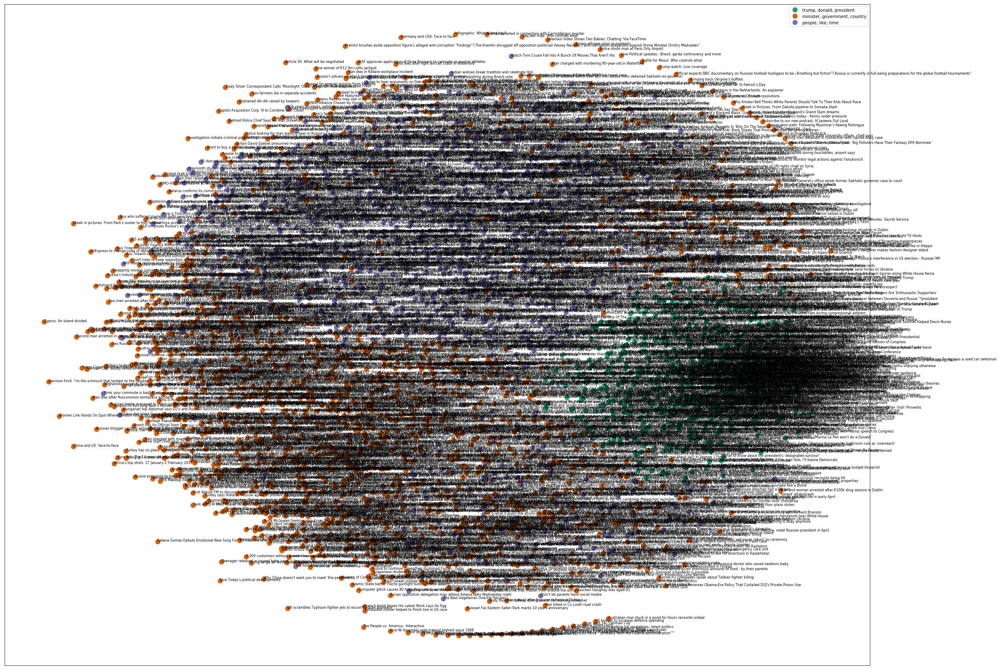

In [90]:
#some ipython magic to show the matplotlib plots inline
%matplotlib inline 

#create data frame that has the result of the MDS plus the cluster numbers and titles
df = pd.DataFrame(dict(x=xs, y=ys, label=clusters, title=titles)) 

#group by cluster
groups = df.groupby('label')


# set up plot
fig, ax = plt.subplots(figsize=(37, 29)) # set size
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling

#iterate through groups to layer the plot
#note that I use the cluster_name and cluster_color dicts with the 'name' lookup to return the appropriate color/label
for name, group in groups:
    ax.plot(group.x, group.y, marker='o', linestyle='', ms=12, 
            label=cluster_names[name], color=cluster_colors[name], 
            mec='none')
    ax.set_aspect('auto')
    ax.tick_params(\
        axis= 'x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelbottom='off')
    ax.tick_params(\
        axis= 'y',         # changes apply to the y-axis
        which='both',      # both major and minor ticks are affected
        left='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelleft='off')
    
ax.legend(numpoints=1)  #show legend with only 1 point

#add label in x,y position with the label as the film title
for i in range(len(df)):
    ax.text(df.ix[i]['x'], df.ix[i]['y'], df.ix[i]['title'], size=8)  

    
    
plt.show() #show the plot

#uncomment the below to save the plot if need be
plt.savefig('clusters_small_noaxes.png', dpi=600)

In [91]:
plt.close()

In [92]:
#define custom toolbar location
class TopToolbar(mpld3.plugins.PluginBase):
    """Plugin for moving toolbar to top of figure"""

    JAVASCRIPT = """
    mpld3.register_plugin("toptoolbar", TopToolbar);
    TopToolbar.prototype = Object.create(mpld3.Plugin.prototype);
    TopToolbar.prototype.constructor = TopToolbar;
    function TopToolbar(fig, props){
        mpld3.Plugin.call(this, fig, props);
    };

    TopToolbar.prototype.draw = function(){
      // the toolbar svg doesn't exist
      // yet, so first draw it
      this.fig.toolbar.draw();

      // then change the y position to be
      // at the top of the figure
      this.fig.toolbar.toolbar.attr("x", 150);
      this.fig.toolbar.toolbar.attr("y", 400);

      // then remove the draw function,
      // so that it is not called again
      this.fig.toolbar.draw = function() {}
    }
    """
    def __init__(self):
        self.dict_ = {"type": "toptoolbar"}

In [96]:
#create data frame that has the result of the MDS plus the cluster numbers and titles
df = pd.DataFrame(dict(x=xs, y=ys, label=clusters, title=titles)) 

#group by cluster
groups = df.groupby('label')

#define custom css to format the font and to remove the axis labeling
css = """
text.mpld3-text, div.mpld3-tooltip {
  font-family:Arial, Helvetica, sans-serif;
}

g.mpld3-xaxis, g.mpld3-yaxis {
display: none; }

svg.mpld3-figure {
margin-left: -200px;}
"""

# Plot 
fig, ax = plt.subplots(figsize=(14,6)) #set plot size
ax.margins(0.03) # Optional, just adds 5% padding to the autoscaling

#iterate through groups to layer the plot
#note that I use the cluster_name and cluster_color dicts with the 'name' lookup to return the appropriate color/label
for name, group in groups:
    points = ax.plot(group.x, group.y, marker='o', linestyle='', ms=18, 
                     label=cluster_names[name], mec='none', 
                     color=cluster_colors[name])
    ax.set_aspect('auto')
    labels = [i for i in group.title]
    
    #set tooltip using points, labels and the already defined 'css'
    tooltip = mpld3.plugins.PointHTMLTooltip(points[0], labels,
                                       voffset=10, hoffset=10, css=css)
    #connect tooltip to fig
    mpld3.plugins.connect(fig, tooltip, TopToolbar())    
    
    #set tick marks as blank
    ax.axes.get_xaxis().set_ticks([])
    ax.axes.get_yaxis().set_ticks([])
    
    #set axis as blank
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)

    
ax.legend(numpoints=1) #show legend with only one dot

mpld3.display() #show the plot

#uncomment the below to export to html
#html = mpld3.fig_to_html(fig)
#print(html)

KeyError: -2580

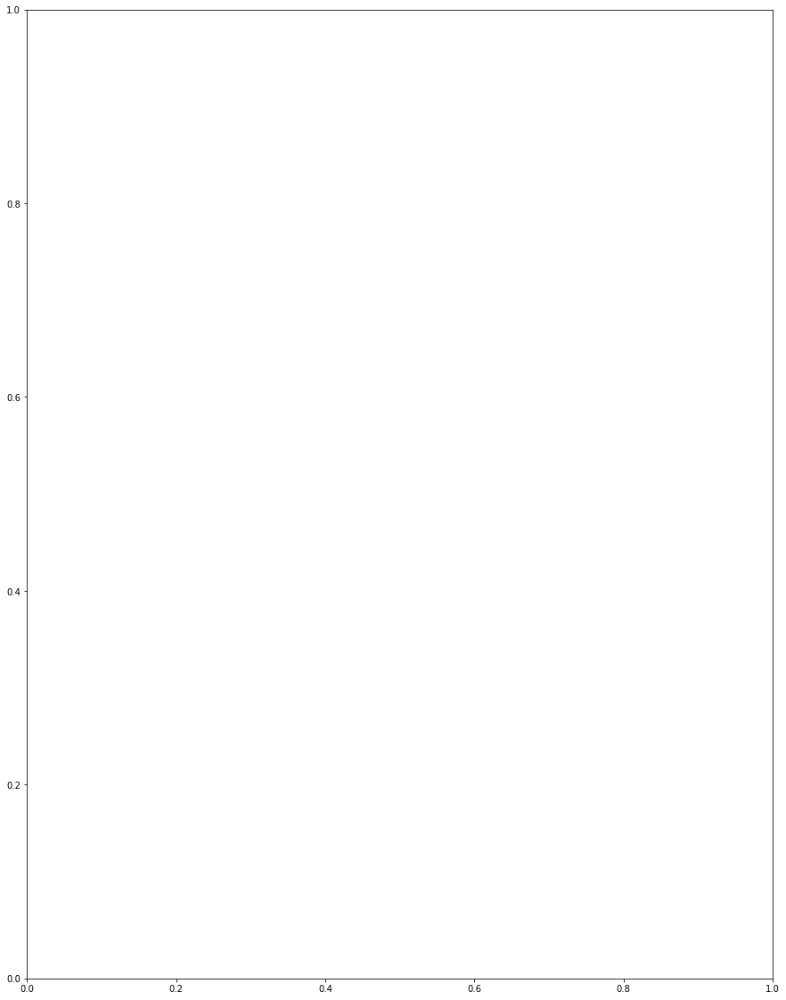

In [97]:
from scipy.cluster.hierarchy import ward, dendrogram

linkage_matrix = ward(dist) #define the linkage_matrix using ward clustering pre-computed distances

fig, ax = plt.subplots(figsize=(15, 20)) # set size
ax = dendrogram(linkage_matrix, orientation="right", labels=titles);

plt.tick_params(\
    axis= 'x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom='off',      # ticks along the bottom edge are off
    top='off',         # ticks along the top edge are off
    labelbottom='off')

plt.tight_layout() #show plot with tight layout

#uncomment below to save figure
plt.savefig('ward_clusters.png', dpi=200) #save figure as ward_clusters

In [98]:
plt.close()

In [99]:
#strip any proper names from a text...unfortunately right now this is yanking the first word from a sentence too.
import string
def strip_proppers(text):
    # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
    tokens = [word for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent) if word.islower()]
    return "".join([" "+i if not i.startswith("'") and i not in string.punctuation else i for i in tokens]).strip()

In [100]:
#strip any proper nouns (NNP) or plural proper nouns (NNPS) from a text
from nltk.tag import pos_tag

def strip_proppers_POS(text):
    tagged = pos_tag(text.split()) #use NLTK's part of speech tagger
    non_propernouns = [word for word,pos in tagged if pos != 'NNP' and pos != 'NNPS']
    return non_propernouns

In [115]:
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/jsche4/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [117]:
from gensim import corpora, models, similarities 

#remove proper names
%time preprocess = [strip_proppers(doc) for doc in text]

#tokenize
%time tokenized_text = [tokenize_and_stem(text) for text in preprocess]

#remove stop words
%time texts = [[word for word in text if word not in stopset] for text in tokenized_text]

CPU times: user 21.3 s, sys: 53 ms, total: 21.4 s
Wall time: 21.4 s
CPU times: user 35 s, sys: 117 ms, total: 35.2 s
Wall time: 35.2 s
CPU times: user 203 ms, sys: 5.2 ms, total: 208 ms
Wall time: 209 ms


In [118]:
#create a Gensim dictionary from the texts
dictionary = corpora.Dictionary(texts)

#remove extremes (similar to the min/max df step used when creating the tf-idf matrix)
dictionary.filter_extremes(no_below=1, no_above=0.8)

#convert the dictionary to a bag of words corpus for reference
corpus = [dictionary.doc2bow(text) for text in texts]

In [122]:
%time lda = models.LdaModel(corpus, num_topics=3, id2word=dictionary, update_every=5, chunksize=100, passes=10)

CPU times: user 1min 32s, sys: 290 ms, total: 1min 33s
Wall time: 1min 33s


In [123]:
lda.show_topics()

[(0,
  '0.007*"govern" + 0.006*"countri" + 0.005*"state" + 0.004*"presid" + 0.004*"peopl" + 0.004*"polit" + 0.004*"elect" + 0.004*"offici" + 0.004*"law" + 0.004*"year"'),
 (1,
  '0.010*"year" + 0.009*"compani" + 0.006*"percent" + 0.006*"market" + 0.005*"develop" + 0.005*"new" + 0.005*"million" + 0.005*"countri" + 0.004*"product" + 0.004*"billion"'),
 (2,
  '0.008*"peopl" + 0.005*"year" + 0.005*"n\'t" + 0.005*"time" + 0.004*"polic" + 0.004*"attack" + 0.004*"famili" + 0.004*"day" + 0.004*"kill" + 0.004*"like"')]

In [131]:
topics_matrix = lda.show_topics(formatted=True, num_words=3)
topics_matrix = topics_matrix

topic_words = topics_matrix
for i in topic_words:
    print([str(word) for word in i])
    print()

['0', '0.007*"govern" + 0.006*"countri" + 0.005*"state"']

['1', '0.010*"year" + 0.009*"compani" + 0.006*"percent"']

['2', '0.008*"peopl" + 0.005*"year" + 0.005*"n\'t"']

